In [149]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

#import sys
#!{sys.executable} -m pip install opencv-python numpy

CUT INNER INSULTION

In [150]:
def detect_cuts(img):
    """
    Trzecia iteracja: Progowanie adaptacyjne + wykrywanie ubytków w izolacji.
    """
    # 1. Konwersja na Lab lub HSV - lepiej oddzielają kolor od jasności
    # Użyjemy kanału 'L' z Lab, który dobrze pokazuje teksturę
    lab = cv2.cvtColor(img, cv2.COLOR_BGR2Lab)
    l_channel, a, b = cv2.split(lab)
    
    # 2. Lekkie rozmycie, by nie widzieć pojedynczych drucików
    blurred = cv2.medianBlur(l_channel, 5)
    
    # 3. Progowanie adaptacyjne - szuka lokalnych "ciemniejszych" dziur w izolacji
    # To wyłapie nacięcie jako zbiór punktów/linii
    thresh = cv2.adaptiveThreshold(blurred, 255, 
                                  cv2.ADAPTIVE_THRESH_GAUSSIAN_C, 
                                  cv2.THRESH_BINARY_INV, 15, 4)
    
    # 4. Maska kołowa (nieco luźniejsza niż poprzednio)
    mask = np.zeros_like(l_channel)
    h, w = l_channel.shape
    cv2.circle(mask, (w // 2, h // 2), int(min(w, h) * 0.42), 255, -1)
    
    # Nakładamy maskę na wynik progowania
    masked_thresh = cv2.bitwise_and(thresh, mask)
    
    # 5. Łączenie punktów w plamy (Dylatacja)
    kernel = np.ones((5, 5), np.uint8)
    dilated = cv2.dilate(masked_thresh, kernel, iterations=2)
    
    # 6. Czyszczenie małych szumów, ale zostawienie nacięć
    contours, _ = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    final_cleaned = np.zeros_like(dilated)
    
    for cnt in contours:
        area = cv2.contourArea(cnt)
        # Zmniejszamy próg powierzchni do 400 (wcześniej było 1000)
        if area > 400:
            cv2.drawContours(final_cleaned, [cnt], -1, 255, -1)
            
    return final_cleaned

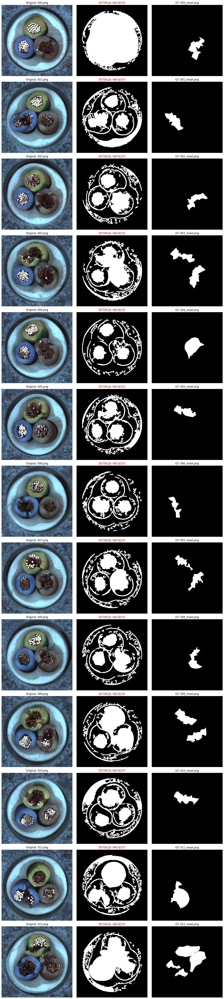

In [151]:
def process_all_images(input_folder, gt_folder):
    images = sorted([f for f in os.listdir(input_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
    
    num_images = len(images)
    if num_images == 0:
        print(f"Pusty folder: {input_folder}")
        return

    fig, axes = plt.subplots(num_images, 3, figsize=(15, 5 * num_images))
    if num_images == 1: axes = np.expand_dims(axes, axis=0)

    for i, filename in enumerate(images):
        img_path = os.path.join(input_folder, filename)
        name_part = os.path.splitext(filename)[0] 
        gt_filename = f"{name_part}_mask.png"
        gt_path = os.path.join(gt_folder, gt_filename)

        img = cv2.imread(img_path)
        if img is None: continue
        
        # --- KOLUMNA 1: ORYGINAŁ ---
        axes[i, 0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axes[i, 0].set_title(f"Original: {filename}")
        axes[i, 0].axis('off')

        # --- KOLUMNA 2: TWOJA LOGIKA (WYKRYWANIE NACIĘĆ) ---
        # Tutaj wywołujemy naszą nową funkcję
        result_mask = detect_cuts(img)
        
        # Sprawdzamy czy coś wykryto (do logiki błędu)
        has_cut = np.sum(result_mask) > 5000 # Próg czułości
        color_title = 'red' if has_cut else 'green'
        status = "DETEKCJA: NACIĘCIE!" if has_cut else "DETEKCJA: OK"

        axes[i, 1].imshow(result_mask, cmap='gray')
        axes[i, 1].set_title(status, color=color_title)
        axes[i, 1].axis('off')

        # --- KOLUMNA 3: GROUND TRUTH ---
        gt = cv2.imread(gt_path, cv2.IMREAD_GRAYSCALE)
        if gt is not None:
            _, gt_bin = cv2.threshold(gt, 1, 255, cv2.THRESH_BINARY)
            axes[i, 2].imshow(gt_bin, cmap='gray')
            axes[i, 2].set_title(f"GT: {gt_filename}")
        else:
            axes[i, 2].imshow(np.zeros_like(result_mask), cmap='gray')
            axes[i, 2].set_title("BRAK MASKI GT", color='orange')
            
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

# --- KONFIGURACJA ŚCIEŻEK ---
input_dir = 'cable/test/cut_inner_insulation'
gt_dir = r'C:\Users\pryce\Downloads\Wizyjne\wizyjneProjekt1\cable\ground_truth\cut_inner_insulation'

process_all_images(input_dir, gt_dir)

MISSING WIRE

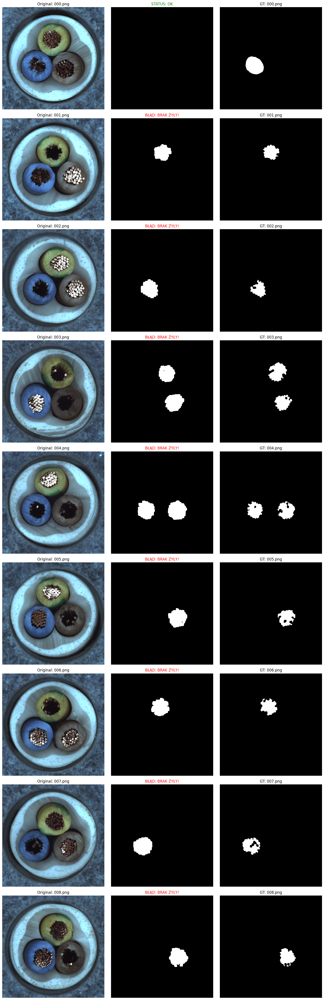

In [176]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

def detect_missing_wire(img):
    """
    Zaawansowana detekcja z filtrem okrągłości i wypukłości (solidity).
    """
    # 1. Preprocessing
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    # Zwiększamy rozmycie, by pozbyć się tekstury miedzi/izolacji
    #blurred = cv2.GaussianBlur(gray, (7, 7), 0)

    # 2. Binaryzacja - szukamy tylko bardzo ciemnych obszarów
    _, black_areas = cv2.threshold(gray, 35, 255, cv2.THRESH_BINARY_INV)

    # 3. Maska kołowa (wycinamy krawędzie zewnętrzne kabla)
    mask = np.zeros_like(gray)
    h, w = gray.shape
    cv2.circle(mask, (w // 2, h // 2), int(min(w, h) * 0.35), 255, -1)
    candidate_mask = cv2.bitwise_and(black_areas, mask)

    # 4. Dylatacja - łączenie poszarpanych fragmentów dziury
    kernel_dil = np.ones((5, 5), np.uint8)
    #dilated_mask = cv2.erode(candidate_mask, kernel_dil, iterations=1)
    dilated_mask = cv2.dilate(candidate_mask, kernel_dil, iterations=1)
    
    # 5. Analiza konturów
    contours, _ = cv2.findContours(dilated_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    final_mask = np.zeros_like(dilated_mask)
    
    # --- PROGI FILTRACJI ---
    circularity_threshold = 0.35  # Podniesione z 0.35 (bardziej "kołowe")
    solidity_threshold = 0.25     # Nowość: jak bardzo kształt jest "pełny" (brak wcięć)
    area_threshold = 3500         # Lekko podniesione

    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area < area_threshold:
            continue

        peri = cv2.arcLength(cnt, True)
        if peri == 0: continue

        # Cyrkularność
        circularity = 4 * np.pi * (area / (peri * peri))

        # Solidity = Area / ConvexHullArea
        # Odcina kształty poszarpane, wklęsłe i nieregularne
        hull = cv2.convexHull(cnt)
        hull_area = cv2.contourArea(hull)
        solidity = float(area) / hull_area if hull_area > 0 else 0

        # DEBUG: odkomentuj, żeby zobaczyć wartości dla błędnych obiektów
        # print(f"Area: {area:.0f}, Circ: {circularity:.2f}, Sold: {solidity:.2f}")

        # AKCEPTACJA: musi być duży, okrągły I wypukły (zwarty)
        if circularity >= circularity_threshold and solidity >= solidity_threshold:
            
          
            cv2.drawContours(final_mask, [cnt], -1, 255, -1)
    final_mask = cv2.dilate(final_mask, kernel_dil, iterations=3)
    return final_mask
def process_missing_wire_dataset(input_folder, gt_folder):
    # Pobieranie obrazów
    images = sorted([f for f in os.listdir(input_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
    
    num_images = len(images)
    if num_images == 0:
        print(f"Pusty folder: {input_folder}")
        return

    fig, axes = plt.subplots(num_images, 3, figsize=(15, 5 * num_images))
    if num_images == 1: axes = np.expand_dims(axes, axis=0)

    for i, filename in enumerate(images):
        img_path = os.path.join(input_folder, filename)
        
        # W missing_wire nazwy plików GT są takie same jak oryginałów
        name_part = os.path.splitext(filename)[0] 
        gt_filename = f"{name_part}_mask.png" 
        gt_path = os.path.join(gt_folder, gt_filename)

        img = cv2.imread(img_path)
        if img is None: continue
        
        # --- KOLUMNA 1: ORYGINAŁ ---
        axes[i, 0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axes[i, 0].set_title(f"Original: {filename}")
        axes[i, 0].axis('off')

        # --- KOLUMNA 2: DETEKCJA BRAKU ŻYŁY ---
        result_mask = detect_missing_wire(img)
        
        # Logika decyzji: jeśli znaleziono duży czarny obszar
        has_missing = np.sum(result_mask) > 2000 
        color_title = 'red' if has_missing else 'green'
        status = "BŁĄD: BRAK ŻYŁY!" if has_missing else "STATUS: OK"

        axes[i, 1].imshow(result_mask, cmap='gray')
        axes[i, 1].set_title(status, color=color_title)
        axes[i, 1].axis('off')

        # --- KOLUMNA 3: GROUND TRUTH ---
        gt = cv2.imread(gt_path, cv2.IMREAD_GRAYSCALE)
        if gt is not None:
            # Upewniamy się, że maska GT jest binarna
            _, gt_bin = cv2.threshold(gt, 1, 255, cv2.THRESH_BINARY)
            axes[i, 2].imshow(gt_bin, cmap='gray')
            axes[i, 2].set_title(f"GT: {filename}")
        else:
            axes[i, 2].imshow(np.zeros_like(result_mask), cmap='gray')
            axes[i, 2].set_title("MISSING GT MASK", color='orange')
            
        axes[i, 2].axis('off')

    plt.tight_layout()
    plt.show()

# --- KONFIGURACJA ŚCIEŻEK (Dopasowana do missing_wire) ---
input_dir = 'cable/test/missing_wire'
gt_dir = r'C:\Users\pryce\Downloads\Wizyjne\wizyjneProjekt1\cable\ground_truth\missing_wire'

process_missing_wire_dataset(input_dir, gt_dir)

BENT WIRE


====== 000.png ======
Obiekty znalezione po detekcji:
  Obiekt 1: area = 7624.5
  Obiekt 2: area = 7378.0

====== 001.png ======
Obiekty znalezione po detekcji:
  Obiekt 1: area = 9459.5
  Obiekt 2: area = 12663.5
  Obiekt 3: area = 17136.0

====== 002.png ======
Obiekty znalezione po detekcji:
  Obiekt 1: area = 16626.5
  Obiekt 2: area = 27255.0

====== 003.png ======
Obiekty znalezione po detekcji:

====== 004.png ======
Obiekty znalezione po detekcji:
  Obiekt 1: area = 20072.5

====== 005.png ======
Obiekty znalezione po detekcji:
  Obiekt 1: area = 24920.5

====== 006.png ======
Obiekty znalezione po detekcji:
  Obiekt 1: area = 17223.5

====== 007.png ======
Obiekty znalezione po detekcji:
  Obiekt 1: area = 42080.5

====== 008.png ======
Obiekty znalezione po detekcji:
  Obiekt 1: area = 7654.5

====== 009.png ======
Obiekty znalezione po detekcji:
  Obiekt 1: area = 5435.0
  Obiekt 2: area = 7280.5
  Obiekt 3: area = 8049.0

====== 010.png ======
Obiekty znalezione po detekcj

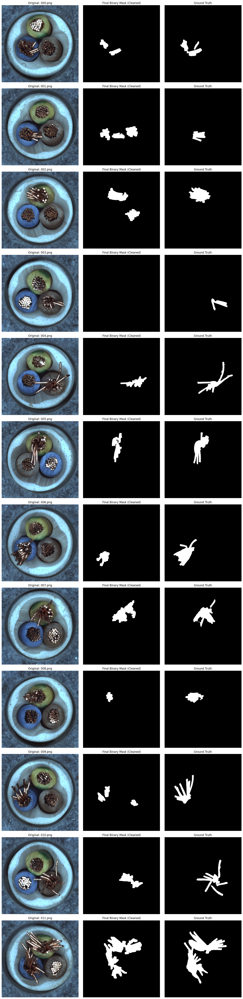

In [39]:
import cv2
import numpy as np
import os
import matplotlib.pyplot as plt

# ----------------------------------------------------------
#  DETEKCJA NIERÓWNOŚCI (BENT WIRE)
# ----------------------------------------------------------
def detect_bent_wire(img):
    # 1. Detekcja koloru miedzi (HSV)
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    lower_copper = np.array([0, 40, 60])
    upper_copper = np.array([25, 255, 255])
    copper_mask = cv2.inRange(hsv, lower_copper, upper_copper)

    # Czyszczenie wstępne
    kernel_small = np.ones((3, 3), np.uint8)
    copper_mask = cv2.morphologyEx(copper_mask, cv2.MORPH_OPEN, kernel_small)
    copper_closed = cv2.morphologyEx(copper_mask, cv2.MORPH_CLOSE, np.ones((15, 15), np.uint8))

    # 2. Usuwanie okrągłych rdzeni (pełne druty)
    contours, _ = cv2.findContours(copper_closed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    good_cores_mask = np.zeros_like(copper_mask)

    for cnt in contours:
        area = cv2.contourArea(cnt)
        if area < 1600:
            continue
        
        hull = cv2.convexHull(cnt)
        hull_area = cv2.contourArea(hull)
        solidity = float(area) / hull_area if hull_area > 0 else 0

        if solidity > 0.85 and area > 2500:
            cv2.drawContours(good_cores_mask, [cnt], -1, 255, -1)

    # Powiększamy maskę rdzeni
    good_cores_mask = cv2.dilate(good_cores_mask, np.ones((7, 7), np.uint8))

    # 3. Odejmowanie rdzeni — zostają tylko krzywe fragmenty
    bent_only = cv2.bitwise_and(copper_mask, cv2.bitwise_not(good_cores_mask))

    # 4. Usuwamy drobne plamki
    final_bent_contours, _ = cv2.findContours(bent_only, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    clean_mask = np.zeros_like(bent_only)

    for cnt in final_bent_contours:
        if cv2.contourArea(cnt) > 2000:
            cv2.drawContours(clean_mask, [cnt], -1, 255, -1)

    # 5. Pogrubienie (dopasowanie do GT)
    final_mask = cv2.dilate(clean_mask, np.ones((5, 5), np.uint8), iterations=4)

    return final_mask


# ----------------------------------------------------------
#  GŁÓWNA FUNKCJA WIZUALIZACJI + CZYSZCZENIE KOŃCOWE
# ----------------------------------------------------------
def process_bent_wire_visual(input_folder, gt_folder):
    images = sorted([f for f in os.listdir(input_folder) if f.lower().endswith(('.png', '.jpg', '.jpeg'))])
    num_images = len(images)
    if num_images == 0: 
        print(f"Brak zdjęć w {input_folder}")
        return

    fig, axes = plt.subplots(num_images, 3, figsize=(15, 5 * num_images))
    if num_images == 1:
        axes = np.expand_dims(axes, axis=0)

    for i, filename in enumerate(images):
        img_path = os.path.join(input_folder, filename)
        gt_filename = f"{os.path.splitext(filename)[0]}_mask.png"
        gt_path = os.path.join(gt_folder, gt_filename)

        img = cv2.imread(img_path)
        if img is None:
            continue

        # ----------------------------------------------------
        # KOLUMNA 1: ORYGINAŁ
        # ----------------------------------------------------
        axes[i, 0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
        axes[i, 0].set_title(f"Original: {filename}")

        # ----------------------------------------------------
        # KOLUMNA 2: DETEKCJA + MASKA BINARYZOWANA + CZYSZCZENIE
        # ----------------------------------------------------
        raw_mask = detect_bent_wire(img)

        # Tworzenie czerwonej wizualizacji
        vis_img = img.copy()
        vis_img[raw_mask > 0] = [0, 0, 255]

        # --- Zamiana czerwonego na MASKĘ BINARYJNĄ (0/255) ---
        red_mask = ((vis_img[:, :, 2] == 255) &
                    (vis_img[:, :, 1] == 0) &
                    (vis_img[:, :, 0] == 0)).astype(np.uint8) * 255

        # --- Usuwanie małych obiektów + WYŚWIETLANIE AREA ---
        contours, _ = cv2.findContours(red_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
        clean_final = np.zeros_like(red_mask)

        print(f"\n====== {filename} ======")
        print("Obiekty znalezione po detekcji:")

        for idx, cnt in enumerate(contours):
            area = cv2.contourArea(cnt)
            print(f"  Obiekt {idx+1}: area = {area}")

            if area > 1000:   # <---- twój próg
                cv2.drawContours(clean_final, [cnt], -1, 255, -1)

        # Wizualizacja finalnej maski PNG
        axes[i, 1].imshow(clean_final, cmap='gray')
        axes[i, 1].set_title("Final Binary Mask (Cleaned)")

        # ----------------------------------------------------
        # KOLUMNA 3: GROUND TRUTH
        # ----------------------------------------------------
        gt = cv2.imread(gt_path, cv2.IMREAD_GRAYSCALE)
        if gt is not None:
            _, gt_bin = cv2.threshold(gt, 1, 255, cv2.THRESH_BINARY)
            axes[i, 2].imshow(gt_bin, cmap='gray')
            axes[i, 2].set_title("Ground Truth")
        else:
            axes[i, 2].imshow(np.zeros_like(clean_final), cmap='gray')
            axes[i, 2].set_title("GT Missing")

        for ax in axes[i]:
            ax.axis('off')

    plt.tight_layout()
    plt.show()


# ----------------------------------------------------------
#  KONFIGURACJA ŚCIEŻEK
# ----------------------------------------------------------
input_dir = 'cable/test/bent_wire'
gt_dir = r'C:\Users\pryce\Downloads\Wizyjne\wizyjneProjekt1\cable\ground_truth\bent_wire'

process_bent_wire_visual(input_dir, gt_dir)